In [1]:
from cv2 import cv2
import numpy as np
import pickle
import requests
import io
import os
%matplotlib inline
import matplotlib.pyplot as plt
from moviepy.editor import *
from scipy.ndimage import gaussian_filter
answers = {}

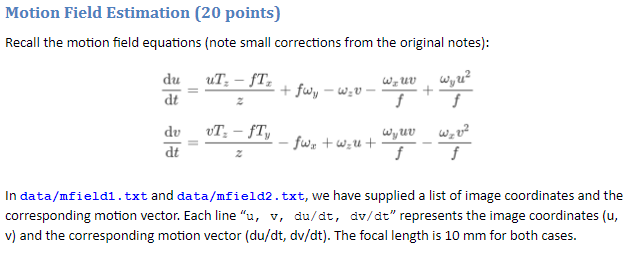

In [2]:
# load data
#response = requests.get('https://github.com/qchenclaire/computer-vision-fall-2020/raw/master/HW3/data/mfield1.txt')
#response.raise_for_status()
mfield1 = np.loadtxt('data/mfield1.txt')

#response = requests.get('https://github.com/qchenclaire/computer-vision-fall-2020/raw/master/HW3/data/mfield2.txt')
#response.raise_for_status()
mfield2 = np.loadtxt('data/mfield2.txt')

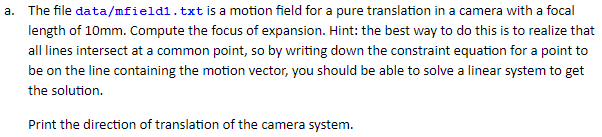

In [3]:
num = mfield1.shape[0]
# a
answers['MF'] = {}
answers['MF']['a'] = {}

f = 10
A = np.ones((num,2),dtype = np.float)
B = np.zeros((num,1),dtype = np.float)
for i in range(num):
    a = mfield1[i,3]/mfield1[i,2]
    A[i][0] = -a
    B[i][0] = mfield1[i,1] - a * mfield1[i,0]

t = np.linalg.inv(np.transpose(A) @ A) @ np.transpose(A) @ B

x = t[0,0]
y = t[1,0]
# TODO: foe should be an array of shape (2,)
foe = np.array([x,y],dtype=np.float)
print("focus of expansion = ", foe)
answers['MF']['a']['foe'] = foe

focus of expansion =  [16. 18.]


In [4]:


# TODO: tranlsation should be a unit vector, an array of shape(3,)
translation = np.array([x,y,f])
translation = translation/np.linalg.norm(translation)
print("translation = ", translation)
answers['MF']['a']['translation'] = translation

translation =  [0.61357199 0.69026849 0.38348249]


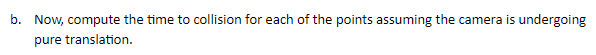

In [5]:
# b
answers['MF']['b'] = {}

# TODO: an array of (20,)
time_collision = []
for i in range(num):
    time_collision.append( (mfield1[i,0]-x) / (mfield1[i,2]) )
#time_collision = np.array(time_collision)
print("time to collision = ", time_collision)
answers['MF']['b']['time_collision'] = time_collision

time to collision =  [5.397011967734386, 4.610795230894571, 0.37932793024416667, 2.718530714658638, 1.7556923671647073, 5.701745967893378, 2.8451858079159713, 4.3009854779967105, 5.288524583910117, 0.7894240498535754, 2.962053173003748, 0.654556321607224, 2.110385281706288, 5.860485962123683, 4.436845275902133, 2.721841139729729, 2.5757388291426104, 1.2067520430349366, 4.351690113439096, 4.430021914506648]


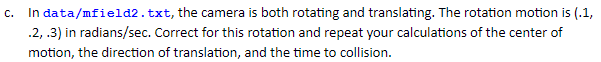

In [6]:
# c
answers['MF']['c'] = {}
f = 10
num = mfield2.shape[0]
A = np.ones((num,2),dtype = np.float)
B = np.zeros((num,1),dtype = np.float)
for i in range(num):
    du_ = mfield2[i,2] -( f * .2) + .3 * mfield2[i,1] + ( .1 * mfield2[i,0] * mfield2[i,1]/f ) - .2 * mfield2[i,0]*mfield2[i,0]/f
    dv_ = mfield2[i,3] + .1 * f       - .3 * mfield2[i,0] - .2 * mfield2[i,0] * mfield2[i,1]/f + .1 * mfield2[i,1]*mfield2[i,1]/f  
    a = dv_ / du_
    b = mfield2[i,1] - a * mfield2[i,0]
   
    A[i][0] = -a
    B[i][0] = b

t = np.linalg.inv(np.transpose(A) @ A) @ np.transpose(A) @ B


x = t[0,0]
y = t[1,0]

# TODO: foe should be an array of shape (2,)
foe = np.array([x,y],dtype=np.float)

print("focus of expansion = ", foe)


focus of expansion =  [50. 15.]


In [7]:
# TODO: tranlsation should be a unit vector, an array of shape(3,)
translation = np.array([x,y,f])
translation = translation/np.linalg.norm(translation)
print("translation = ", translation)



translation =  [0.94072087 0.28221626 0.18814417]


In [8]:
# TODO: an array of (20,)
time_collision = []
for i in range(num):
    du1 = mfield2[i,2] -( f * .2) + .3 * mfield2[i,1] + ( .1 * mfield2[i,0] * mfield2[i,1]/f ) - .2 * mfield2[i,0]*mfield2[i,0]/f
    time_collision.append( (mfield2[i,0]-x) / (du1) )

print("time to collision = ", time_collision)

answers['MF']['c']['foe'] = foe
answers['MF']['c']['translation'] = translation
answers['MF']['c']['time_collision'] = time_collision

time to collision =  [22.758947773374903, 20.681792322942712, 2.8613030563761597, 6.795465502353757, 5.610023479841184, 15.882134663472328, 21.615180486794063, 25.09655433103253, 16.67313403183434, 24.382802010949764, 21.882210685254158, 13.271291553994747, 27.269151658334398, 28.338944180897407, 24.343290961658045, 24.037914681503082, 3.4024238992499254, 8.884095076150135, 15.243771957134573, 10.337408385002059]


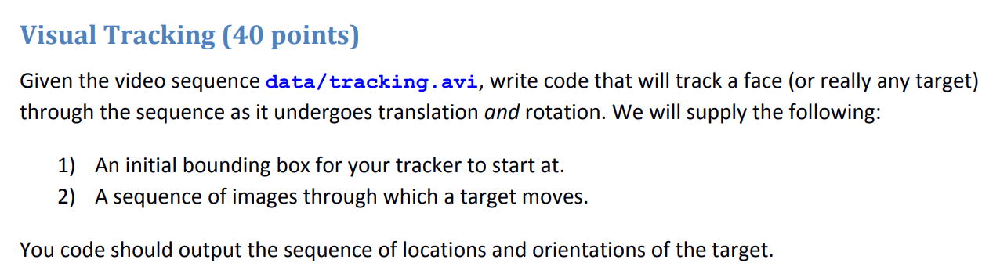

In [9]:
# download video
#if not os.path.exists('tracking.avi'):
#  ! wget https://github.com/qchenclaire/computer-vision-fall-2020/raw/master/HW3/data/tracking.avi

# play the video
path ="./data/tracking.avi" 
clip = VideoFileClip(path)
clip.ipython_display()

t:   2%|█                                                                   | 10/650 [00:00<00:06, 99.28it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


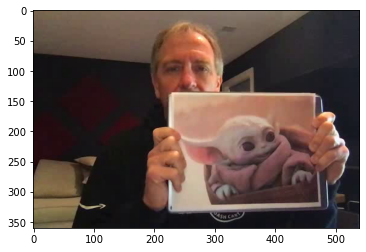

In [10]:
# load video into a generator of images
def v2i(filename, scale=1):
  cap = cv2.VideoCapture(filename)
  while(True):
    ret, frame = cap.read()
    if ret: 
      frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      frame = cv2.resize(frame, (frame.shape[1] // scale, frame.shape[0] // scale))
      yield frame
    else: break

# show first frame
# downsample scale. If the motion is too large you may want to downsample the image. But for autograding, keep scale as 1
scale = 1
video = v2i('./data/tracking.avi', scale)
#print(video.shape)
frame0 = next(video)
plt.imshow(frame0, cmap = 'gray')

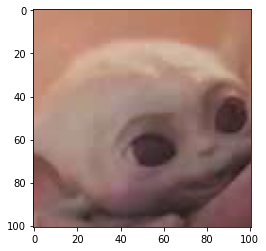

In [11]:
def crop_rotated(image, center, window_size, angle):

  """ Crops a region from image centered about center, of size window_size, and 
      at angle angle.
      Args:
        image: Image to be cropped, of shape [height, width, channels]
        center: Center of crop, (col index, row index))
        window_size: Size of window to crop, of shape tuple (int, int)
        angle: Angle of window to crop, int. The angle is in degree and a positive angle rotates the box clockwisely.
      Returns:
        image_crop: Cropped rotated image about center and at angle
                    shape should be [window_size[0], window_size[1], channels]
  """

  # Formats the inputs to the required format
  center, window_size = tuple(map(int, center)), tuple(map(int, window_size))

  # Get the shape of the image 
  height, width = image.shape[0], image.shape[1]

  # Calculate the rotation matrix about the center provided
  M = cv2.getRotationMatrix2D(center, angle, 1)

  # Rotate the original image
  image_rot = cv2.warpAffine(image, M, (width, height))

  # Crop from the rotated image
  image_crop = cv2.getRectSubPix(image_rot, window_size, center)

  return image_crop


# show target of the first frame
d0 = np.array([350., 210.]) / scale
s = (101 / scale, 101 / scale)
theta0 = 0
tgt = crop_rotated(frame0, d0, s, theta0)
plt.imshow(tgt, cmap='gray')

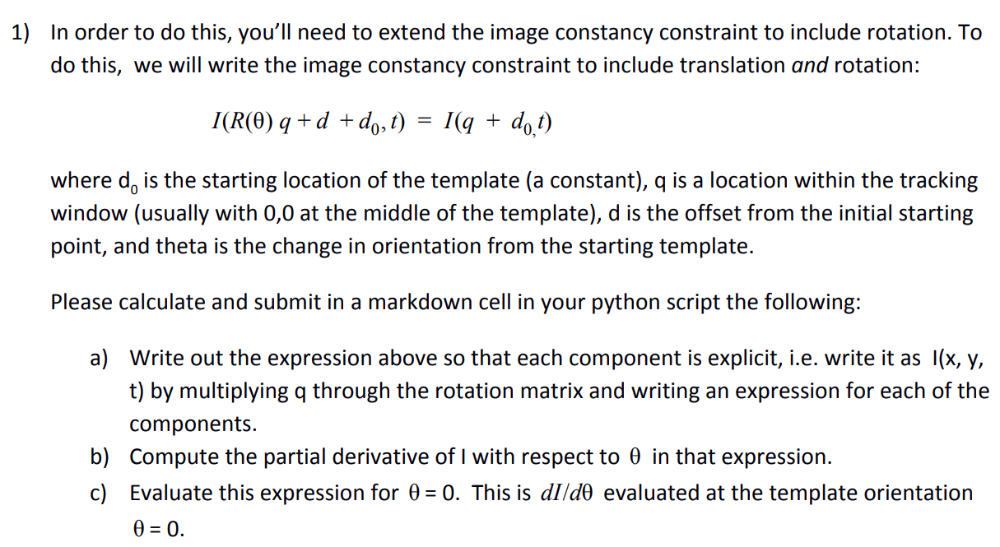

# a)

$$R(\theta)q=\begin{pmatrix}cos(\theta) & -sin(\theta) \\ sin(\theta) & cos(\theta)\\ \end{pmatrix}\begin{pmatrix}q_x \\ q_y\\ \end{pmatrix}$$

$$ I(R(\theta)q+d+d_0,t)= I(cos(\theta)q_x-sin(\theta)q_y+d_x+{d_0}_x , sin(\theta)q_x+cos(\theta)q_y+d_y+{d_0}_y ,t) ,. $$

# b)

$$\frac{dx}{d\theta} = -sin(\theta)q_x-cos(\theta)q_y$$

$$\frac{dy}{d\theta} = cos(\theta)q_x-sin(\theta)q_y$$

$$\frac{dI}{d\theta}=\frac{dI}{dx}\frac{dx}{d\theta}+\frac{dI}{dy}\frac{dy}{d\theta}$$

# c )

when $\theta=0$ 

$$\frac{dI}{d\theta}=\frac{dI}{dx}(-q_y) +\frac{dI}{dy}(q_x) $$

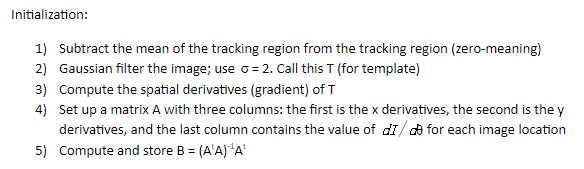

In [12]:
# initialization 1: Subtract the mean of the tracking region from the tracking region (zero-meaning)
# TODO: array of (101, 101)
#gray_tgt = cv2.cvtColor(tgt, cv2.COLOR_BGR2GRAY)
gray_tgt = cv2.cvtColor(tgt, cv2.COLOR_RGB2GRAY)
avg = np.mean(gray_tgt)
normalized_tgt = gray_tgt - avg
#print(normalized_tgt.sum())
# do not modify answers format
answers['Tracking'] = {}
answers['Tracking']['init1'] = normalized_tgt.sum()

In [13]:
# initialization 2: Gaussian filter the image; use = 2. Call this T (for template)
# TODO: array of (101, 101)
T = gaussian_filter(normalized_tgt, sigma=2 )
answers['Tracking']['init2'] = T.sum()

In [14]:
# initialization 3: Compute the spatial derivatives (gradient) of T

# TODO: gy, gx are both array of (101, 101), use np.gradient()
#print(T.shape)
gy, gx = np.gradient(T)


answers['Tracking']['init3'] = {}
answers['Tracking']['init3']['gx'] = gx.sum()
answers['Tracking']['init3']['gy'] = gy.sum()

In [15]:
# initialization 4: Set up a matrix A with three columns: 
# TODO: 
A = np.zeros((101*101,3),dtype = np.float)
derivative = np.zeros((101,101),dtype = np.float)
for i in range(101):
    for j in range(101):
        derivative[i,j] = gx[i,j]*(-i + 50.0) + gy[i,j]*(j-50.0)
        #derivative[i,j] = gx[i,j] + (-1)*gy[i,j]
#derivative = derivative.T
A[:,0] = gx.flatten()
A[:,1] = gy.flatten()
A[:,2] = derivative.flatten()

answers['Tracking']['init4'] = A.sum()
#print(gx.sum())
#print(gy.sum())
#print(derivative.sum())
print(A.sum())

-17104.85636680769


In [16]:
# initialization 5: Compute and store B
# TODO:
#answer is around -0.12
B = np.linalg.inv(np.transpose(A) @ A) @ np.transpose(A)
answers['Tracking']['init5'] = B.sum()
print(B.sum())

#print(B.shape)

-0.10137186972501781


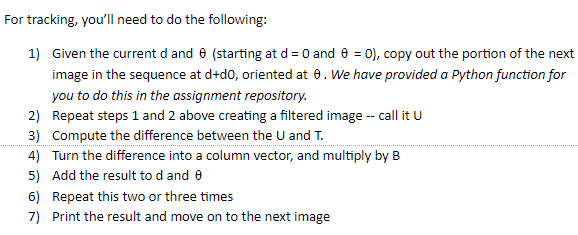

In [17]:
# utility function to draw rotated box on image
def center_to_corner_box2d(center, dim, angle):
    """ change box representation from (center, dimension, angle) to coordinates of four corners
      Args:
        center: (col index, row index)
        dim: (width, height)
        angle: Angle of window to crop, int. The angle is in radian and a positive angle rotates the box clockwisely.
      Returns:
        corners: 4 x 2 array and each row is a corner coordinate
  """ 
    corners = np.array([[-0.5, -0.5], [-0.5, 0.5], [0.5, 0.5], [0.5, -0.5]])
    corners[:, 0] *= dim[0] 
    corners[:, 1] *= dim[1]
    c, s = np.cos(-angle), np.sin(-angle)
    R = np.array(((c, -s), (s, c)))
    corners = (R @ corners.T).T
    corners[:, 0] += center[0]
    corners[:, 1] += center[1]
    return corners
    
    

In [18]:
# tracking
video = v2i('./data/tracking.avi', scale)
ori_video = v2i('./data/tracking.avi')
d = np.zeros_like(d0)
theta = 0
d_seq = []
theta_seq = []

# store output video for demo
out = []


while True:
#for i in range(1):
    try:
        frame = next(video)
        # TODO: 1) - 7)

        #################################  1-2)
        for i in range(5):
            tgt = crop_rotated(frame, d0 + d , s,  np.rad2deg(theta))
            #plt.imshow(tgt, cmap='gray')
            gray_tgt = cv2.cvtColor(tgt, cv2.COLOR_RGB2GRAY)
            avg = np.mean(gray_tgt)
            normalized_tgt = gray_tgt - avg

            U = gaussian_filter(normalized_tgt, sigma=2 )

            #################################  3)    
            gy, gx = np.gradient(U)
            A = np.zeros((101*101,3),dtype = np.float)
            derivative = np.zeros((101,101),dtype = np.float)
            for i in range(101):
                for j in range(101):
                    derivative[i,j] = gx[i,j]*(-i + 50.0) + gy[i,j]*(j-50.0)
                    #derivative[i,j] = gx[i,j] + (-1)*gy[i,j]
            #derivative = derivative.T
            A[:,0] = gx.flatten()
            A[:,1] = gy.flatten()
            A[:,2] = derivative.flatten()
            B = np.linalg.inv(np.transpose(A) @ A) @ np.transpose(A)
            
            
            
            
            
            #################################
            diff = T - U
            
            diff = diff.flatten()
            diff = B @ diff

            #print(diff)
            d = d.copy() + (diff[0],diff[1])
            #d = d - (diff[0],diff[1])
            theta += diff[2]
        # draw box on video for demo
        ori_frame = next(ori_video)
        box_corner = center_to_corner_box2d((d0+d) * scale, (s[0] * scale, s[1] * scale), -theta)
        cv2.drawContours(ori_frame,[box_corner.astype(int)],0,(0,0,255),2)
        out.append(ori_frame)
        

        d_seq.append(d)
        theta_seq.append(theta)

    except:
        break
#array of (650, 2)
d_seq = np.vstack(d_seq)
print(d_seq.shape)
# array of (650,)
theta_seq = np.array(theta_seq)
answers['Tracking']['d_seq'] = d_seq[10::50]
answers['Tracking']['theta_seq'] = theta_seq[10::50]



(650, 2)


In [19]:
# show annotated video
clip = ImageSequenceClip(out, fps=20)
clip.ipython_display()

t:   1%|▊                                                                    | 8/651 [00:00<00:08, 79.42it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [20]:
# show expected results of the first 50 frames(demo is in BGR but doesn't matter). You need to do the full video.
if not os.path.exists('demo.avi'):
  ! wget https://github.com/qchenclaire/computer-vision-fall-2020/raw/master/HW3/demo.avi

# play the video
path ="demo.avi" 
clip = VideoFileClip(path)
clip.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4

Moviepy - Done !


Moviepy - video ready __temp__.mp4


In [21]:
# finally submit your answers.pickle and HW3.ipynb. Please do not miss either file or add extra files. Wait for some time for answers.pkl to appear in your folder. Yay! This is the end of all the homeworks!
pickle.dump(answers, open('answers.pkl', 'wb'))

In [22]:
answers

{'MF': {'a': {'foe': array([16., 18.]),
   'translation': array([0.61357199, 0.69026849, 0.38348249])},
  'b': {'time_collision': [5.397011967734386,
    4.610795230894571,
    0.37932793024416667,
    2.718530714658638,
    1.7556923671647073,
    5.701745967893378,
    2.8451858079159713,
    4.3009854779967105,
    5.288524583910117,
    0.7894240498535754,
    2.962053173003748,
    0.654556321607224,
    2.110385281706288,
    5.860485962123683,
    4.436845275902133,
    2.721841139729729,
    2.5757388291426104,
    1.2067520430349366,
    4.351690113439096,
    4.430021914506648]},
  'c': {'foe': array([50., 15.]),
   'translation': array([0.94072087, 0.28221626, 0.18814417]),
   'time_collision': [22.758947773374903,
    20.681792322942712,
    2.8613030563761597,
    6.795465502353757,
    5.610023479841184,
    15.882134663472328,
    21.615180486794063,
    25.09655433103253,
    16.67313403183434,
    24.382802010949764,
    21.882210685254158,
    13.271291553994747,
    